### 配置运行环境（方法1：利用Anaconda）
```
conda env create -f environment.yaml
conda activate animatediff
```

### 配置运行环境（方法2：本地pip install）

```
bash env.sh
```

### 下载图像生成模型Stable Diffusion及视频Motion模型的权重文件：
```
git lfs install
git clone https://huggingface.co/runwayml/stable-diffusion-v1-5 models/StableDiffusion/

bash download_bashscripts/0-MotionModule.sh
```

### 下载个性化的图像生成模型权重文件：
我们提供了6中不同的风格，你可以用下面的命令下载权重。
```
bash download_bashscripts/1-ToonYou.sh
bash download_bashscripts/2-Lyriel.sh
bash download_bashscripts/3-RcnzCartoon.sh
bash download_bashscripts/4-MajicMix.sh
bash download_bashscripts/5-RealisticVision.sh
bash download_bashscripts/6-Tusun.sh
bash download_bashscripts/7-FilmVelvia.sh
bash download_bashscripts/8-GhibliBackground.sh
```


# import 要求的包


In [1]:
import argparse
import datetime
import inspect
import os
from omegaconf import OmegaConf
import torch
import diffusers
from diffusers import AutoencoderKL, DDIMScheduler
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer
from animatediff.models.unet import UNet3DConditionModel
from animatediff.pipelines.pipeline_animation import AnimationPipeline
from animatediff.utils.util import save_videos_grid
from animatediff.utils.util import load_weights
from diffusers.utils.import_utils import is_xformers_available
from einops import rearrange, repeat
import csv, pdb, glob
import math
from pathlib import Path
import easydict


/home/qid/.conda/envs/home/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/qid/.conda/envs/home/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/qid/.conda/envs/home/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda9SetDeviceEi'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


# 定义并加载模型，以及所需要的配置文件 （推理部分的代码）

In [2]:

def main(args):
    *_, func_args = inspect.getargvalues(inspect.currentframe())
    func_args = dict(func_args)
    
    time_str = datetime.datetime.now().strftime("%Y-%m-%dT%H-%M-%S")
    savedir = f"samples/{Path(args.config).stem}-{time_str}"
    os.makedirs(savedir)

    config  = OmegaConf.load(args.config)
    samples = []
    
    sample_idx = 0
    for model_idx, (config_key, model_config) in enumerate(list(config.items())):
        
        motion_modules = model_config.motion_module
        motion_modules = [motion_modules] if isinstance(motion_modules, str) else list(motion_modules)
        for motion_module in motion_modules:
            inference_config = OmegaConf.load(model_config.get("inference_config", args.inference_config))

            ### >>> create validation pipeline >>> ###
            tokenizer    = CLIPTokenizer.from_pretrained(args.pretrained_model_path, subfolder="tokenizer")
            text_encoder = CLIPTextModel.from_pretrained(args.pretrained_model_path, subfolder="text_encoder")
            vae          = AutoencoderKL.from_pretrained(args.pretrained_model_path, subfolder="vae")            
            unet         = UNet3DConditionModel.from_pretrained_2d(args.pretrained_model_path, subfolder="unet", unet_additional_kwargs=OmegaConf.to_container(inference_config.unet_additional_kwargs))

            if is_xformers_available(): unet.enable_xformers_memory_efficient_attention()
            else: assert False

            pipeline = AnimationPipeline(
                vae=vae, text_encoder=text_encoder, tokenizer=tokenizer, unet=unet,
                scheduler=DDIMScheduler(**OmegaConf.to_container(inference_config.noise_scheduler_kwargs)),
            ).to("cuda")

            pipeline = load_weights(
                pipeline,
                # motion module
                motion_module_path         = motion_module,
                motion_module_lora_configs = model_config.get("motion_module_lora_configs", []),
                # image layers
                dreambooth_model_path      = model_config.get("dreambooth_path", ""),
                lora_model_path            = model_config.get("lora_model_path", ""),
                lora_alpha                 = model_config.get("lora_alpha", 0.8),
            ).to("cuda")

            prompts      = model_config.prompt
            n_prompts    = list(model_config.n_prompt) * len(prompts) if len(model_config.n_prompt) == 1 else model_config.n_prompt
            
            random_seeds = model_config.get("seed", [-1])
            random_seeds = [random_seeds] if isinstance(random_seeds, int) else list(random_seeds)
            random_seeds = random_seeds * len(prompts) if len(random_seeds) == 1 else random_seeds
            
            config[config_key].random_seed = []
            for prompt_idx, (prompt, n_prompt, random_seed) in enumerate(zip(prompts, n_prompts, random_seeds)):
                
                # manually set random seed for reproduction
                if random_seed != -1: torch.manual_seed(random_seed)
                else: torch.seed()
                config[config_key].random_seed.append(torch.initial_seed())
                
                print(f"current seed: {torch.initial_seed()}")
                print(f"sampling {prompt} ...")
                sample = pipeline(
                    prompt,
                    negative_prompt     = n_prompt,
                    num_inference_steps = model_config.steps,
                    guidance_scale      = model_config.guidance_scale,
                    width               = args.W,
                    height              = args.H,
                    video_length        = args.L,
                ).videos
                samples.append(sample)

                prompt = "-".join((prompt.replace("/", "").split(" ")[:10]))
                save_videos_grid(sample, f"{savedir}/sample/{sample_idx}-{prompt}.gif")
                print(f"save to {savedir}/sample/{prompt}.gif")
                
                sample_idx += 1

    samples = torch.concat(samples)
    save_videos_grid(samples, f"{savedir}/sample.gif", n_rows=4)

    OmegaConf.save(config, f"{savedir}/config.yaml")

# 定义要生成视频的属性，通过配置文件设定

In [3]:




args = easydict.EasyDict({
    "pretrained_model_path": "/mnt/blob/stable-diffusion-v1-5",     #下载的图像生成模型Stable Diffusion的权重路径
    "inference_config": "configs/inference/inference-v1.yaml",      #推理任务的配置文件
    "config": "configs/prompts/1-ToonYou.yaml",                     #当前任务的配置文件，可在里面修改路径及输入文本
    "L": 16,                                                        #视频长度：默认16帧
    "H": 512,                                                       #视频每帧高度： 默认512像素
    "W": 512                                                        #视频每帧宽度： 默认512像素


})

main(args)


loaded temporal unet's pretrained weights from /mnt/blob/stable-diffusion-v1-5/unet ...
### missing keys: 560; 
### unexpected keys: 0;
### Temporal Module Parameters: 417.1376 M


/mnt/blob/itp3/homework/AnimateDiff/animatediff/pipelines/pipeline_animation.py:70: FutureWarning: The configuration file of this scheduler: DDIMScheduler {
  "_class_name": "DDIMScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.012,
  "beta_schedule": "linear",
  "beta_start": 0.00085,
  "clip_sample": true,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": true,
  "steps_offset": 0,
  "trained_betas": null
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for the `scheduler/scheduler_config.json` file
  deprecate("steps_offset!=1", "1.0.0", deprecation_message, standard_warn=False)
/mnt/blob/itp3/homework/AnimateDiff/animatediff/pipelines/pipeline_animation.py:83: FutureWarning: T

load motion module from models/Motion_Module/mm_sd_v14.ckpt
load dreambooth model from models/DreamBooth_LoRA/toonyou_beta3.safetensors


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.9.self_attn.out_proj.bias', 'vision_model.encoder.layers.11.self_attn.q_proj.bias', 'vision_model.encoder.layers.16.mlp.fc1.weight', 'vision_model.embeddings.class_embedding', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.11.self_attn.out_proj.bias', 'vision_model.encoder.layers.7.layer_norm1.bias', 'vision_model.encoder.layers.14.self_attn.k_proj.bias', 'vision_model.encoder.layers.10.self_attn.out_proj.weight', 'vision_model.encoder.layers.22.layer_norm2.bias', 'vision_model.encoder.layers.19.layer_norm1.weight', 'vision_model.encoder.layers.17.layer_norm2.weight', 'vision_model.encoder.layers.17.layer_norm1.bias', 'vision_model.encoder.layers.1.self_attn.v_proj.weight', 'vision_model.encoder.layers.11.self_attn.out_proj.weight', 'vision_model.encoder.layers.2.self_attn.out_proj.weight', 'vision_model

current seed: 10788741199826055526
sampling best quality, masterpiece, 1girl, looking at viewer, blurry background, upper body, contemporary, dress ...


100%|██████████| 16/16 [00:01<00:00,  9.53it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1girl,-looking-at-viewer,-blurry-background,-upper.gif
current seed: 6520604954829636163
sampling masterpiece, best quality, 1girl, solo, cherry blossoms, hanami, pink flower, white flower, spring season, wisteria, petals, flower, plum blossoms, outdoors, falling petals, white hair, black eyes, ...


100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/masterpiece,-best-quality,-1girl,-solo,-cherry-blossoms,-hanami,-pink-flower,.gif
current seed: 6519455744612555650
sampling best quality, masterpiece, 1boy, formal, abstract, looking at viewer, masculine, marble pattern ...


100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1boy,-formal,-abstract,-looking-at-viewer,-masculine,.gif
current seed: 16372571278361863751
sampling best quality, masterpiece, 1girl, cloudy sky, dandelion, contrapposto, alternate hairstyle, ...


100%|██████████| 16/16 [00:01<00:00,  9.52it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1girl,-cloudy-sky,-dandelion,-contrapposto,-alternate-hairstyle,.gif
loaded temporal unet's pretrained weights from /mnt/blob/stable-diffusion-v1-5/unet ...
### missing keys: 560; 
### unexpected keys: 0;
### Temporal Module Parameters: 417.1376 M
load motion module from models/Motion_Module/mm_sd_v15.ckpt
load dreambooth model from models/DreamBooth_LoRA/toonyou_beta3.safetensors


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.9.self_attn.out_proj.bias', 'vision_model.encoder.layers.11.self_attn.q_proj.bias', 'vision_model.encoder.layers.16.mlp.fc1.weight', 'vision_model.embeddings.class_embedding', 'vision_model.encoder.layers.21.self_attn.v_proj.bias', 'vision_model.encoder.layers.11.self_attn.out_proj.bias', 'vision_model.encoder.layers.7.layer_norm1.bias', 'vision_model.encoder.layers.14.self_attn.k_proj.bias', 'vision_model.encoder.layers.10.self_attn.out_proj.weight', 'vision_model.encoder.layers.22.layer_norm2.bias', 'vision_model.encoder.layers.19.layer_norm1.weight', 'vision_model.encoder.layers.17.layer_norm2.weight', 'vision_model.encoder.layers.17.layer_norm1.bias', 'vision_model.encoder.layers.1.self_attn.v_proj.weight', 'vision_model.encoder.layers.11.self_attn.out_proj.weight', 'vision_model.encoder.layers.2.self_attn.out_proj.weight', 'vision_model

current seed: 10788741199826055526
sampling best quality, masterpiece, 1girl, looking at viewer, blurry background, upper body, contemporary, dress ...


100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1girl,-looking-at-viewer,-blurry-background,-upper.gif
current seed: 6520604954829636163
sampling masterpiece, best quality, 1girl, solo, cherry blossoms, hanami, pink flower, white flower, spring season, wisteria, petals, flower, plum blossoms, outdoors, falling petals, white hair, black eyes, ...


100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/masterpiece,-best-quality,-1girl,-solo,-cherry-blossoms,-hanami,-pink-flower,.gif
current seed: 6519455744612555650
sampling best quality, masterpiece, 1boy, formal, abstract, looking at viewer, masculine, marble pattern ...


100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1boy,-formal,-abstract,-looking-at-viewer,-masculine,.gif
current seed: 16372571278361863751
sampling best quality, masterpiece, 1girl, cloudy sky, dandelion, contrapposto, alternate hairstyle, ...


100%|██████████| 16/16 [00:01<00:00,  9.46it/s]


save to samples/1-ToonYou-2023-10-07T05-11-59/sample/best-quality,-masterpiece,-1girl,-cloudy-sky,-dandelion,-contrapposto,-alternate-hairstyle,.gif


In [4]:
### 将上面生成的gif图可视化出来

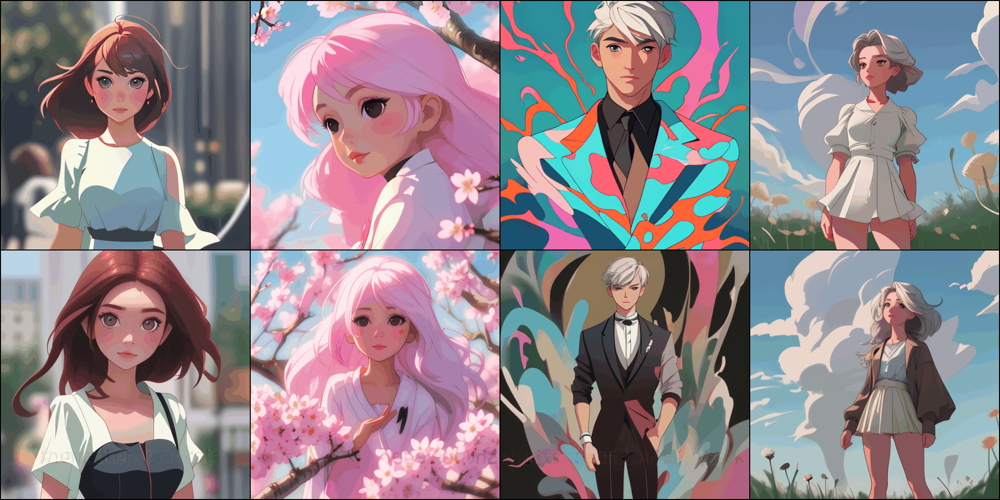

In [5]:
from IPython.display import display, Image

# 读取本地的GIF文件
file_path = '/mnt/blob/itp3/homework/AnimateDiff/samples/1-ToonYou-2023-10-06T13-49-03/sample.gif'  # 替换为你本地的GIF文件路径
with open(file_path, "rb") as f:
    gif_data = f.read()

# 显示GIF
display(Image(data=gif_data, format='png'))
